In [1]:
import cv2
import matplotlib.pyplot as plt
import albumentations as A
import numpy as np

INFO:albumentations.check_version:A new version of Albumentations is available: 1.4.16 (you have 1.4.11). Upgrade using: pip install --upgrade albumentations


In [2]:
img = cv2.imread('araras.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

In [3]:
def plot_results(original, result):
    fig, axes = plt.subplots(1, 2, figsize=(8, 4))
    ax = axes.ravel()

    ax[0].imshow(original)
    ax[1].imshow(result)
    
    fig.tight_layout()
    plt.show()

# transform = A.Defocus(always_apply=True)
# result = transform(image=img)
#plot_results(img, result['image'])

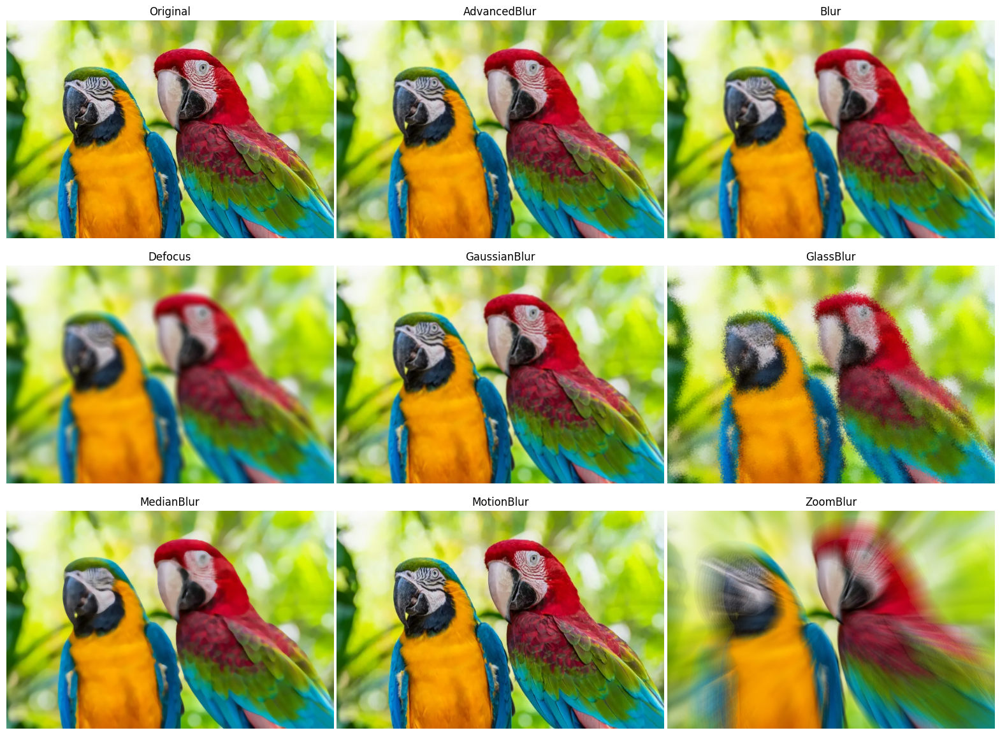

In [4]:
aug_title = ['AdvancedBlur', 'Blur', 'Defocus', 'GaussianBlur', 'GlassBlur', 'MedianBlur', 'MotionBlur', 'ZoomBlur']

t = []
t.append(A.AdvancedBlur(always_apply=True))
t.append(A.Blur(always_apply=True))
t.append(A.Defocus(always_apply=True))
t.append(A.GaussianBlur(always_apply=True))
t.append(A.GlassBlur(always_apply=True))
t.append(A.MedianBlur(always_apply=True))
t.append(A.MotionBlur(always_apply=True))
t.append(A.ZoomBlur(always_apply=True))

fig, axes = plt.subplots(3, 3, figsize=(20, 15), gridspec_kw = {'wspace':0.01, 'hspace':0})
ax = axes.ravel()
ax[0].imshow(img)
ax[0].title.set_text('Original')
ax[0].set_axis_off()

for i in range(0, len(t)):
    result = t[i](image=img)
    ax[i+1].imshow(result['image'])
    ax[i+1].title.set_text(aug_title[i])
    ax[i+1].set_axis_off()

plt.show()

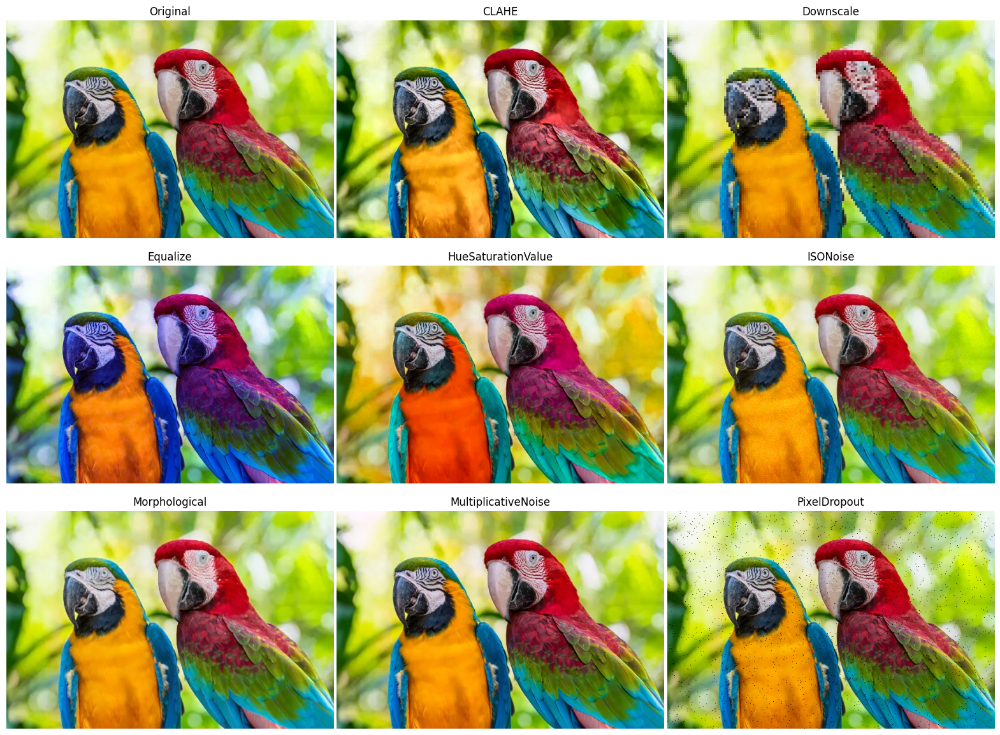

In [5]:
aug_title = ['CLAHE', 'Downscale', 'Equalize', 'HueSaturationValue', 'ISONoise', 'Morphological', 'MultiplicativeNoise', 'PixelDropout']
#aug_title = ['RandomGravel', 'RandomShadow', 'RingingOvershoot', 'Sharpen', 'Rotate', 'SafeRotate', 'Affine', 'Perspective']
#aug_title = ['PiecewiseAffine', 'ShiftScaleRotate', '', '', '', '', '', '']


fig, axes = plt.subplots(3, 3, figsize=(20, 15), gridspec_kw = {'wspace':0.01, 'hspace':0})
ax = axes.ravel()
ax[0].imshow(img)
ax[0].title.set_text('Original')
ax[0].set_axis_off()

for i in range(0, len(aug_title)):
    result = getattr(A, aug_title[i])(always_apply=True)(image=img)
    ax[i+1].imshow(result['image'])
    ax[i+1].title.set_text(aug_title[i])
    ax[i+1].set_axis_off()

plt.show()

In [6]:
img_cancer = cv2.imread('cancer.png')
img_cancer = cv2.cvtColor(img_cancer, cv2.COLOR_BGR2RGB)
img_mask = cv2.imread('cancer_mask.png')
img_mask = cv2.cvtColor(img_mask, cv2.COLOR_BGR2RGB)
print(np.shape(img_mask))
print(type(img_mask[0][0][0]))
img_mask[img_mask < 128] = 0
img_mask[img_mask >= 128] = 255
print(np.shape(img_mask))
print(type(img_mask[0][0][0]))
np.unique(img_mask)

(220, 220, 3)
<class 'numpy.uint8'>
(220, 220, 3)
<class 'numpy.uint8'>


array([  0, 255], dtype=uint8)

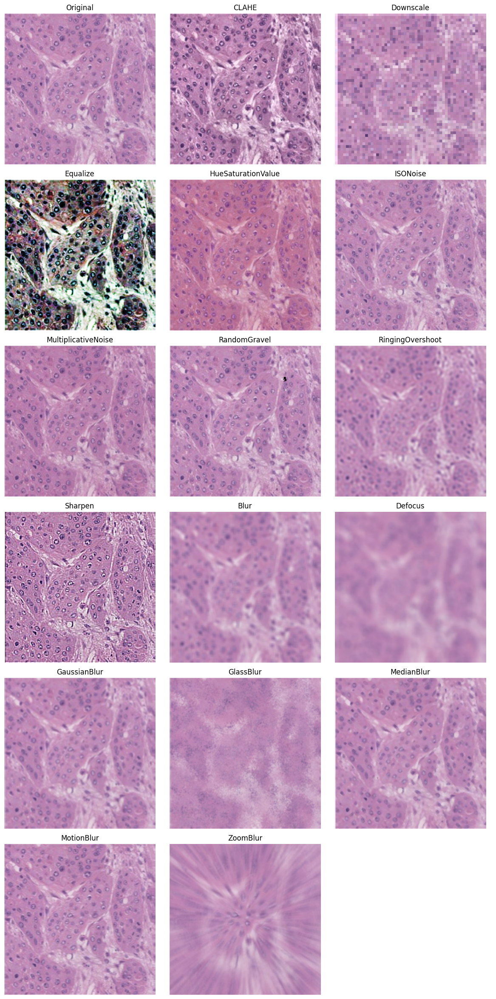

In [7]:
aug_title = ['CLAHE', 'Downscale', 'Equalize', 'HueSaturationValue', 'ISONoise', 'MultiplicativeNoise', 'RandomGravel', 'RingingOvershoot', 'Sharpen', 'Blur', 'Defocus', 'GaussianBlur', 'GlassBlur', 'MedianBlur', 'MotionBlur', 'ZoomBlur']

#Needs to apply at mask: Morphological, PixelDropout, Rotate, SafeRotate, Perspective, ShiftScaleRotate

fig, axes = plt.subplots(6, 3, figsize=(15, 30), gridspec_kw = {'wspace':0.01, 'hspace':0.1})
ax = axes.ravel()
ax[0].imshow(img_cancer)
ax[0].title.set_text('Original')
ax[0].set_axis_off()

for i in range(0, len(aug_title)):
    result = getattr(A, aug_title[i])(always_apply=True)(image=img_cancer)
    ax[i+1].imshow(result['image'])
    ax[i+1].title.set_text(aug_title[i])
    ax[i+1].set_axis_off()

ax[-1].set_axis_off()

plt.show()

Original [  0 255]
Morphological [  0 255]
PixelDropout [  0 255]
Rotate [  0 255]
SafeRotate [  0 255]
Perspective [  0 255]
ShiftScaleRotate [  0 255]


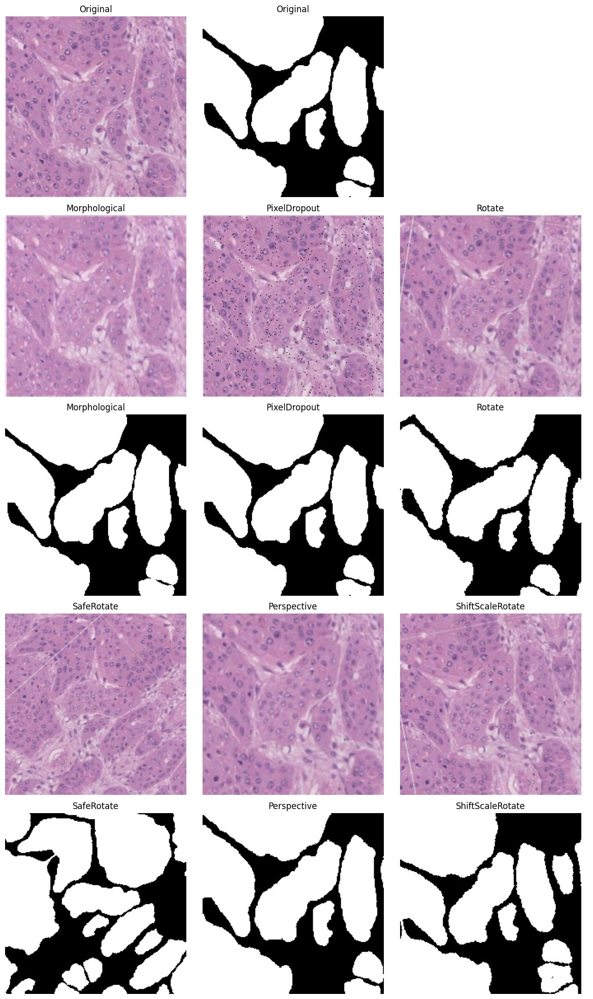

In [8]:
#Needs to apply at mask: Morphological, PixelDropout, Rotate, SafeRotate, Perspective, ShiftScaleRotate
aug_title = ['Morphological', 'PixelDropout', 'Rotate', 'SafeRotate', 'Perspective', 'ShiftScaleRotate']

fig, axes = plt.subplots(5, 3, figsize=(15, 25), gridspec_kw = {'wspace':0.01, 'hspace':0.1})
ax = axes.ravel()
ax[0].imshow(img_cancer)
ax[0].title.set_text('Original')
ax[0].set_axis_off()
ax[1].imshow(img_mask)
ax[1].title.set_text('Original')
ax[1].set_axis_off()
ax[2].set_axis_off()

print('Original', np.unique(img_mask))

for i, j in enumerate([3, 4, 5, 9, 10, 11]):
    result = getattr(A, aug_title[i])(always_apply=True)(image=img_cancer, mask=img_mask)
    ax[j].imshow(result['image'])
    ax[j].title.set_text(aug_title[i])
    ax[j].set_axis_off()
    ax[j+3].imshow(result['mask'])
    ax[j+3].title.set_text(aug_title[i])
    ax[j+3].set_axis_off()
    print(aug_title[i], np.unique(result['mask']))

plt.show()

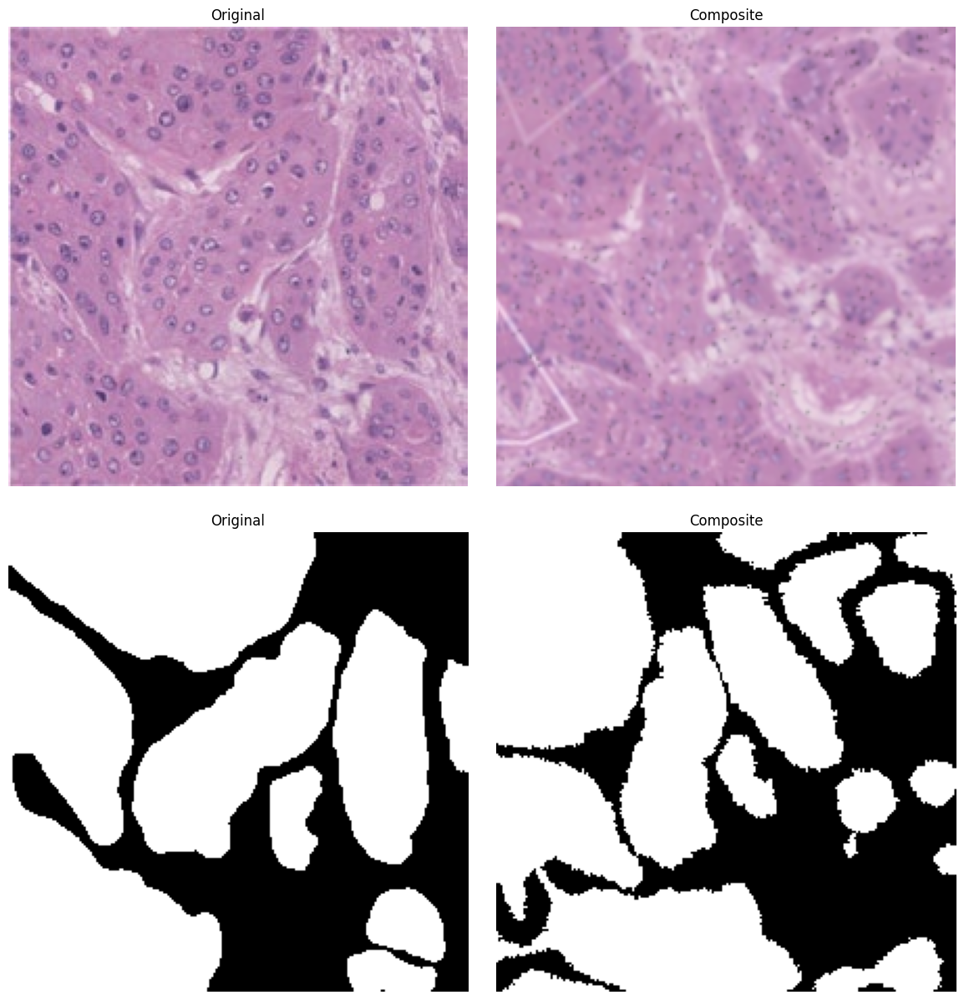

In [9]:
# Composite Transform test

#Needs to apply at mask: Morphological, PixelDropout, Rotate, SafeRotate, Perspective, ShiftScaleRotate
aug_title = ['Morphological', 'PixelDropout', 'Rotate', 'SafeRotate', 'Perspective', 'ShiftScaleRotate']

t = []
for a in aug_title:
    t.append(getattr(A, a)(always_apply=True))

transform = A.Compose(t)

fig, axes = plt.subplots(2, 2, figsize=(15, 15), gridspec_kw = {'wspace':0.01, 'hspace':0.1})
ax = axes.ravel()
ax[0].imshow(img_cancer)
ax[0].title.set_text('Original')
ax[0].set_axis_off()
ax[2].imshow(img_mask)
ax[2].title.set_text('Original')
ax[2].set_axis_off()

result = transform(image=img_cancer, mask=img_mask)
ax[1].imshow(result['image'])
ax[1].title.set_text('Composite')
ax[1].set_axis_off()
ax[3].imshow(result['mask'])
ax[3].title.set_text('Composite')
ax[3].set_axis_off()


plt.show()